# SinGAN
| Harmonization

## IMPORT MODULE

In [1]:
import os
os.environ["CUDA_VISIBLE_DEVICES"]="0"

In [2]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import cv2
import glob
import datetime

## DEFINE PARAMETER

In [3]:
algorithm = 'SinGAN'
num_epoch = [2000, 2000, 2000, 2000, 2000, 2000, 2000, 2000]
filters = [32, 32, 32, 32, 32, 32, 32, 32]
learning_rate = 0.0005
batch_size = 1
iter_grad = 3

num_scale = 8
noise_scale = 1
noise_amp = 0.1
scale = 3/4
L_rec = 10
L_adv = 1

# WGAN_GP Parateter
D_lambda = 1
print(date_time)

20210608-22-39-48


## Define Func

In [4]:
# 이미지 정규화
# -1~1 사이의 값으로 바꿔준다
def img_norm(img):
    return (img - (255/2)) / (255/2)

# 이미지 역정규화
# np.clip : min보다(0) 작은 값들을 min으로 바꾸고 max보다(1) 큰 값들을 max값으로 바꿔주는 함수
def denorm(img):
    out = (img + 1) / 2
    return np.clip(out, 0, 1)

# 배치 사이즈 조절때
def img_resize(img, img_size):
    out = [cv2.resize(img, (img_size[1], img_size[0]))]
    return out

# noise random 생성
def img_noise(img_size):
    noise_amp = 0.1
    out = [np.random.uniform(-1,1,[img_size[0], img_size[1], img_size[2]])*noise_amp]
    return out

# noise scale 생성
def noise_fix(img_size):
    out = []
    for i in range(num_scale):
        if i < noise_scale:
            out.append(img_noise(img_size[i]))
        else:
            out.append([np.zeros(img_size[i])])
    return out

## Load Image

/home/ubuntu/anaconda3/envs/tensorflow_p36/lib/python3.6/site-packages/ipykernel_launcher.py:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/ubuntu/anaconda3/envs/tensorflow_p36/lib/python3.6/site-packages/ipykernel_launcher.py:23: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray


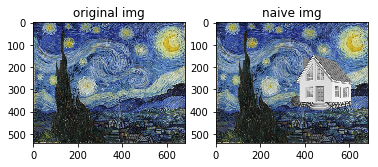

In [6]:
input_img = glob.glob('./image/starrynight.jpg') #origin
naive_img = glob.glob('./image/starrynight_edited.jpg') # naive

sample = cv2.cvtColor(cv2.imread(input_img[0]),cv2.COLOR_BGR2RGB)
sample_naive = cv2.cvtColor(cv2.imread(naive_img[0]),cv2.COLOR_BGR2RGB)
img_size = np.shape(sample)
img_size_set = []

img_N = []
img_naive_N = []

for i in range(num_scale):
    img_N.append(cv2.resize(sample, (int(img_size[1]*(scale**i)), int(img_size[0]*(scale**i)))))
    img_naive_N.append(cv2.resize(sample_naive, (int(img_size[1]*(scale**i)), int(img_size[0]*(scale**i)))))
    img_size_set.append(np.shape(img_N[i]))

fig, ax = plt.subplots(1,2)
ax[0].imshow(img_N[0])
ax[0].set_title('original img')
ax[1].imshow(img_naive_N[0])
ax[1].set_title('naive img')
img_N = img_norm(np.array(img_N))[::-1]
img_naive_N = img_norm(np.array(img_naive_N))[::-1]
img_size_set = img_size_set[::-1]

## NETWORK

In [7]:
class SinGAN():
    def __init__(self):
        # GPU 메모리 증가 허용
        config = tf.ConfigProto()
        # 실행 과정에서 요구되는 만큼의 GPU 메모리만 할당하게 함
        config.gpu_options.allow_growth = True
        self.sess = tf.InteractiveSession(config=config)
        self.GAN()
        
    def conv_block(self, inp, n_filter, n_kernel, norm, act, i):
        conv = tf.layers.conv2d(inp, filters=n_filter, kernel_size=n_kernel, strides=1, padding="SAME", name="conv_"+i,
                                kernel_initializer=tf.initializers.glorot_uniform())
        # batch 정규화 : batch 단위로 정규화
        if norm == "B":
            conv = tf.layers.batch_normalization(conv)
        # 구현 시 배치 정규화를 사용하는 것이 이상해 instance 정규화 사용
        elif norm == "I":
            conv = tf.contrib.layers.instance_norm(conv)
            
        if act == "L":
            conv = tf.nn.leaky_relu(conv)
        elif act == "T":
            conv = tf.nn.tanh(conv)
            
        return conv

    def generator(self, img, noise, n_filter, net_name):
        # noise 입력받아 가짜 이미지 생성 (Residual 구조)
        # 커널 수만 다르고 연산자는 같아 동일한 receptive field 가짐. 생성하는 image 크기만 다르다
        # 각 구조는 3*3 Conv -> BatchNorm -> LeakyReLU를 5번 반복한 fully connected 구조
        inp = img + noise
        with tf.variable_scope(net_name, reuse=tf.AUTO_REUSE):
            conv1 = self.conv_block(inp, n_filter*8, 3, "I", "L", "1")
            conv2 = self.conv_block(conv1, n_filter*4, 3, "I", "L", "2")
            conv3 = self.conv_block(conv2, n_filter*2, 3, "I", "L", "3")
            conv4 = self.conv_block(conv3, n_filter, 3, "I", "L", "4")
            
            ## Receptive field 크기 11x11
            img_gen = self.conv_block(conv4, 3, 3, "I", "T", "5")
            out = img_gen + img
        return out

    def discriminator(self, img, n_filter, net_name):
        with tf.variable_scope(net_name, reuse=tf.AUTO_REUSE):
            conv1 = self.conv_block(img, n_filter*1, 3, "B", "L", "1")
            conv2 = self.conv_block(conv1, n_filter*2, 3, "B", "L", "2")
            conv3 = self.conv_block(conv2, n_filter*4, 3, "B", "L", "3")
            conv4 = self.conv_block(conv3, n_filter*8, 3, "B", "L", "4")
            conv5 = self.conv_block(conv4, 1, 3, "", "", "5")
            
            ## Receptive field 크기 11x11
            # 결과 평균 내 사용
            logit = tf.reduce_mean(conv5)
        return logit
    
    def adv_loss(self, real, fake, D_real, D_fake, n_filter, scale):
        # Adversarial loss 
        # WGAN-GP Loss
        eps = tf.random_uniform(shape=tf.shape(real),minval=0.0, maxval=1.0)
        x_hat = (eps * real) + ((1-eps) * fake)
        D_hat = self.discriminator(x_hat, n_filter, "dis_" + str(scale))
        grad = tf.gradients(D_hat, [x_hat])[0]
        GP = D_lambda * tf.square(tf.norm(grad, ord=2) - 1)
        
        D_loss = D_fake - D_real + GP
        G_loss = - D_fake
        return G_loss, D_loss
        
    def rec_loss(self, real, fake):
        # Reconstruction loss
        # 생성한 이미지와 원래의 이미지 간의 차이를 줄이는 방향으로 학습하기 위함
        # MSE Loss
        G_loss = tf.reduce_mean(tf.square(real - fake))
        return G_loss
        
    def GAN(self):
        self.learning_rate = tf.placeholder(shape=[], dtype=tf.float32)
        self.is_train = tf.placeholder(dtype=tf.bool)
        
        self.inp = {}
        self.noise = {}
        self.inp_fix = {}
        self.noise_fix = {}
        self.real = {}
        self.fake = {}
        self.fake_fix = {}
        self.real_D = {}
        self.fake_D = {}
        
        self.loss_gen = {}
        self.loss_dis = {}

        for i in range(num_scale):
            self.inp[str(i)] = tf.placeholder(shape=[batch_size,None,None,3], dtype=tf.float32)
            self.inp_fix[str(i)] = tf.placeholder(shape=[batch_size,None,None,3], dtype=tf.float32)
            
            self.noise[str(i)] = tf.placeholder(shape=[batch_size,None,None,3], dtype=tf.float32)
            self.noise_fix[str(i)] = tf.placeholder(shape=[batch_size,None,None,3], dtype=tf.float32)
            
            self.real[str(i)] = tf.placeholder(shape=[batch_size,None,None,3], dtype=tf.float32)

            self.fake[str(i)] = self.generator(self.inp[str(i)], self.noise[str(i)], filters[i], "gen_" + str(i))
            self.fake_fix[str(i)] = self.generator(self.inp_fix[str(i)], self.noise_fix[str(i)], filters[i], "gen_" + str(i))
            
            self.real_D[str(i)] = self.discriminator(self.real[str(i)], filters[i], "dis_" + str(i))
            self.fake_D[str(i)] = self.discriminator(self.fake[str(i)], filters[i], "dis_" + str(i))
      
            adv_gen, adv_dis = self.adv_loss(self.real[str(i)], self.fake[str(i)],
                                             self.real_D[str(i)], self.fake_D[str(i)],
                                             filters[i], i)
        
            rec_gen = self.rec_loss(self.real[str(i)], self.fake_fix[str(i)])

            self.loss_gen[str(i)] = L_adv*adv_gen + L_rec*rec_gen
            self.loss_dis[str(i)] = L_adv*adv_dis
            
        self.var_all = tf.trainable_variables()
        self.var_gen = {}
        self.var_dis = {}
        self.opt_gen = {}
        self.opt_dis = {}
        update_ops = tf.get_collection(tf.GraphKeys.UPDATE_OPS)
        
        for i in range(num_scale):
            self.var_gen[str(i)] = [var for var in self.var_all if "gen_" + str(i) in var.name]
            self.var_dis[str(i)] = [var for var in self.var_all if "dis_" + str(i) in var.name]
            
            opt_gen = tf.train.AdamOptimizer(learning_rate=self.learning_rate, beta1=0.5, beta2=0.999)
            opt_dis = tf.train.AdamOptimizer(learning_rate=self.learning_rate, beta1=0.5, beta2=0.999)
            
            with tf.control_dependencies(update_ops):
                self.opt_gen[str(i)] = opt_gen.minimize(self.loss_gen[str(i)], var_list=self.var_gen[str(i)])
                self.opt_dis[str(i)] = opt_dis.minimize(self.loss_dis[str(i)], var_list=self.var_dis[str(i)])

## Initialization

In [8]:
#  초기화
network = SinGAN()
init = tf.global_variables_initializer()
network.sess.run(init)

Instructions for updating:
Use `tf.keras.layers.Conv2D` instead.
Instructions for updating:
Please use `layer.__call__` method instead.
The TensorFlow contrib module will not be included in TensorFlow 2.0.
For more information, please see:
  * https://github.com/tensorflow/community/blob/master/rfcs/20180907-contrib-sunset.md
  * https://github.com/tensorflow/addons
  * https://github.com/tensorflow/io (for I/O related ops)
If you depend on functionality not listed there, please file an issue.

Instructions for updating:
Use keras.layers.BatchNormalization instead.  In particular, `tf.control_dependencies(tf.GraphKeys.UPDATE_OPS)` should not be used (consult the `tf.keras.layers.batch_normalization` documentation).


## Train

Scale: 0 / Epoch: 250 / G Loss: 1633.36572 / D Loss: -242.06226


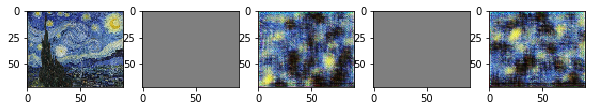

Scale: 0 / Epoch: 500 / G Loss: 1637.27454 / D Loss: -244.52261


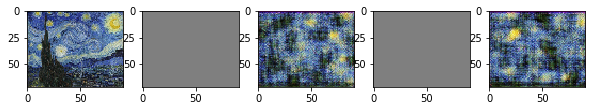

Scale: 0 / Epoch: 750 / G Loss: -800.80023 / D Loss: -222.32726


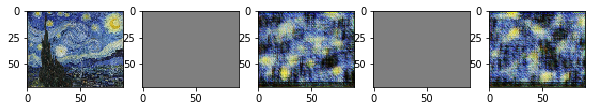

Scale: 0 / Epoch: 1000 / G Loss: -793.26312 / D Loss: -264.63458


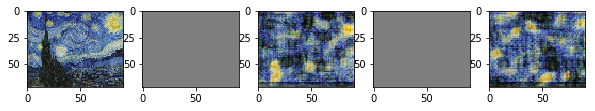

Scale: 0 / Epoch: 1250 / G Loss: -1069.96326 / D Loss: -253.72035


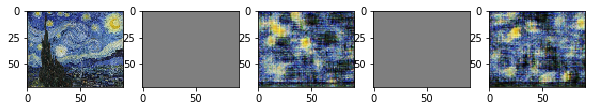

Scale: 0 / Epoch: 1500 / G Loss: -1109.13953 / D Loss: -265.96420


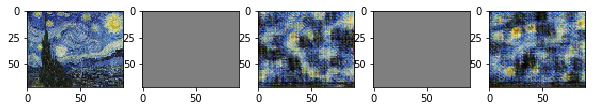

Scale: 0 / Epoch: 1750 / G Loss: -1024.57458 / D Loss: -274.72385


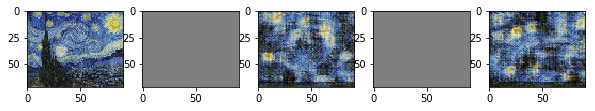

Scale: 0 / Epoch: 2000 / G Loss: -1129.62256 / D Loss: -223.45239


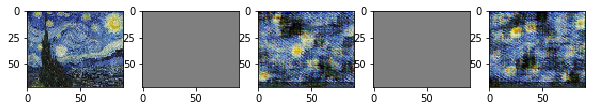

Assignment is finished!
Scale: 1 / Epoch: 250 / G Loss: -1604.19995 / D Loss: -104.89038


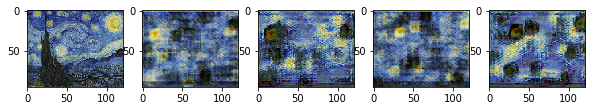

Scale: 1 / Epoch: 500 / G Loss: -1416.01941 / D Loss: -109.24722


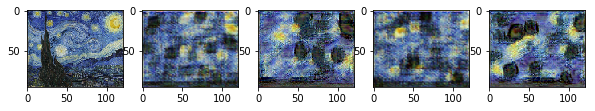

Scale: 1 / Epoch: 750 / G Loss: -1672.53455 / D Loss: -119.64590


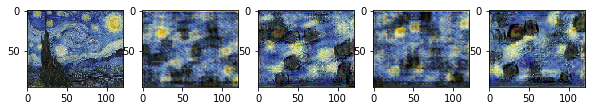

Scale: 1 / Epoch: 1000 / G Loss: -1783.37744 / D Loss: -184.93402


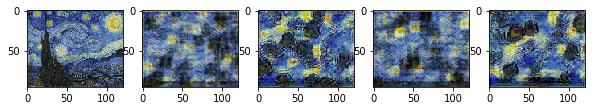

Scale: 1 / Epoch: 1250 / G Loss: -1712.93127 / D Loss: -80.81294


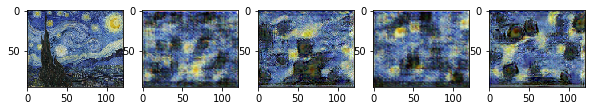

Scale: 1 / Epoch: 1500 / G Loss: -1769.79993 / D Loss: -119.42194


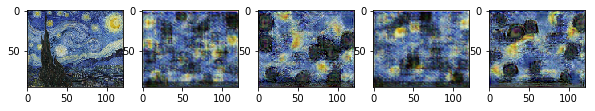

Scale: 1 / Epoch: 1750 / G Loss: -1680.00696 / D Loss: -140.63928


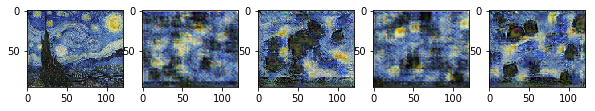

Scale: 1 / Epoch: 2000 / G Loss: -1569.06140 / D Loss: -161.90555


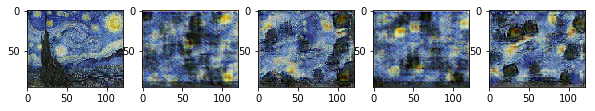

Assignment is finished!
Scale: 2 / Epoch: 250 / G Loss: -1477.60632 / D Loss: -93.99130


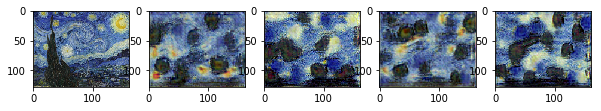

Scale: 2 / Epoch: 500 / G Loss: -1473.17590 / D Loss: -84.95949


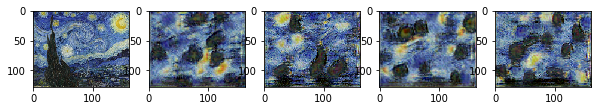

Scale: 2 / Epoch: 750 / G Loss: -1353.50317 / D Loss: -154.92378


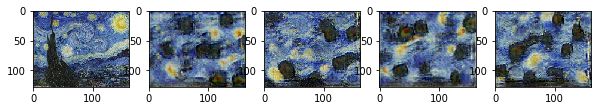

Scale: 2 / Epoch: 1000 / G Loss: -1418.71643 / D Loss: -170.42010


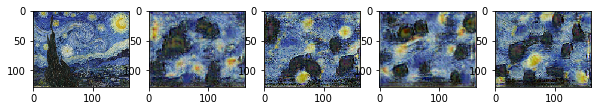

Scale: 2 / Epoch: 1250 / G Loss: -1484.01038 / D Loss: -218.59279


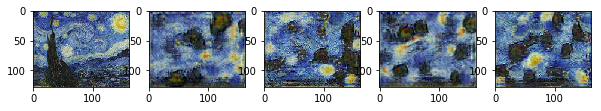

Scale: 2 / Epoch: 1500 / G Loss: -842.04926 / D Loss: -170.01509


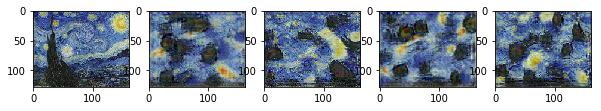

Scale: 2 / Epoch: 1750 / G Loss: -745.38873 / D Loss: -190.66071


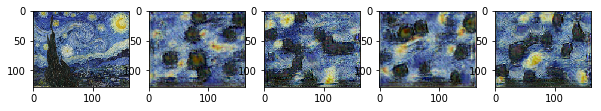

Scale: 2 / Epoch: 2000 / G Loss: -1147.57812 / D Loss: -198.29433


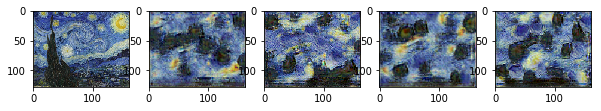

Assignment is finished!
Scale: 3 / Epoch: 250 / G Loss: -581.00000 / D Loss: -229.87402


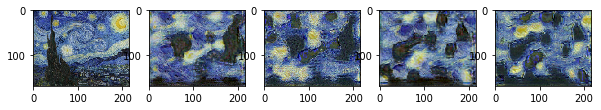

Scale: 3 / Epoch: 500 / G Loss: -750.30640 / D Loss: -124.11411


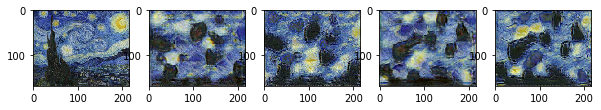

Scale: 3 / Epoch: 750 / G Loss: -495.60596 / D Loss: -154.50046


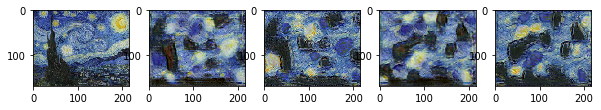

Scale: 3 / Epoch: 1000 / G Loss: -495.27869 / D Loss: -149.78595


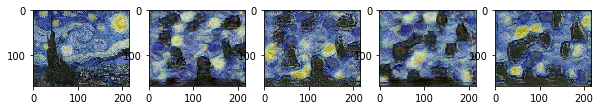

Scale: 3 / Epoch: 1250 / G Loss: -515.06982 / D Loss: -188.17642


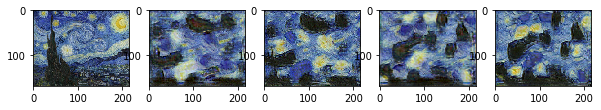

Scale: 3 / Epoch: 1500 / G Loss: -475.53656 / D Loss: -189.28616


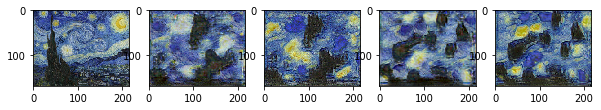

Scale: 3 / Epoch: 1750 / G Loss: -126.96178 / D Loss: -177.67395


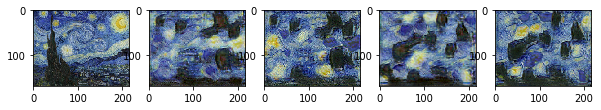

Scale: 3 / Epoch: 2000 / G Loss: -350.65512 / D Loss: -190.54544


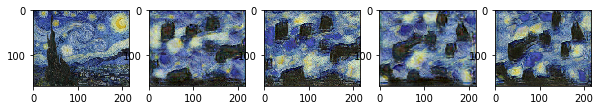

Assignment is finished!
Scale: 4 / Epoch: 250 / G Loss: -32.22220 / D Loss: -149.31241


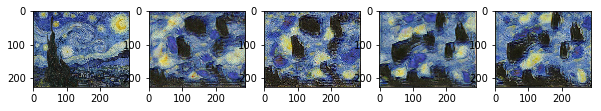

Scale: 4 / Epoch: 500 / G Loss: -487.58289 / D Loss: -197.45587


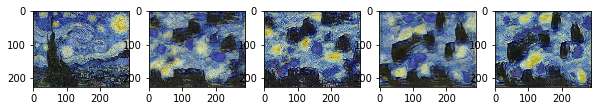

Scale: 4 / Epoch: 750 / G Loss: -224.21796 / D Loss: -149.49030


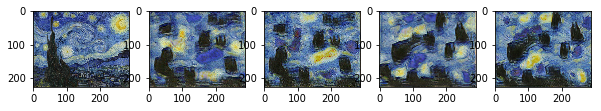

Scale: 4 / Epoch: 1000 / G Loss: -975.66614 / D Loss: -177.71725


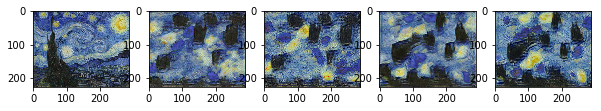

Scale: 4 / Epoch: 1250 / G Loss: -440.63000 / D Loss: -69.12108


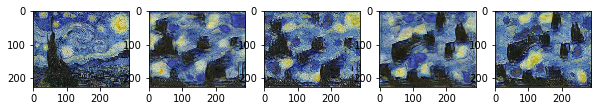

Scale: 4 / Epoch: 1500 / G Loss: -312.87051 / D Loss: -165.63547


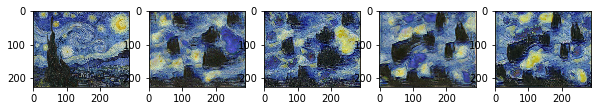

Scale: 4 / Epoch: 1750 / G Loss: -492.62997 / D Loss: -140.27179


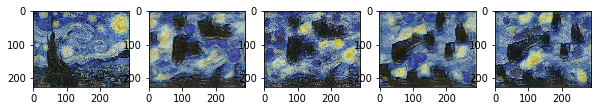

Scale: 4 / Epoch: 2000 / G Loss: -482.28558 / D Loss: -181.48911


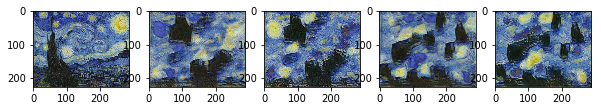

Assignment is finished!
Scale: 5 / Epoch: 250 / G Loss: -413.71179 / D Loss: -125.83938


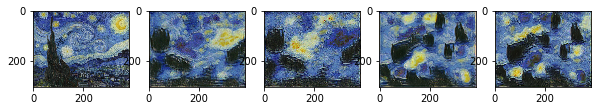

Scale: 5 / Epoch: 500 / G Loss: -145.68973 / D Loss: -120.87362


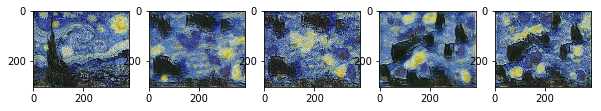

Scale: 5 / Epoch: 750 / G Loss: -421.07437 / D Loss: -158.77661


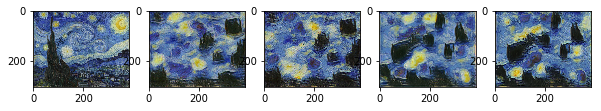

Scale: 5 / Epoch: 1000 / G Loss: -149.26375 / D Loss: -154.99347


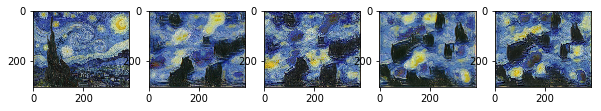

Scale: 5 / Epoch: 1250 / G Loss: -552.19226 / D Loss: -151.99023


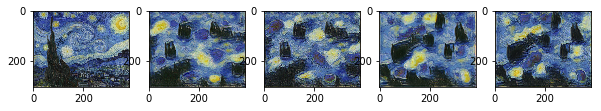

Scale: 5 / Epoch: 1500 / G Loss: -572.07306 / D Loss: -169.78493


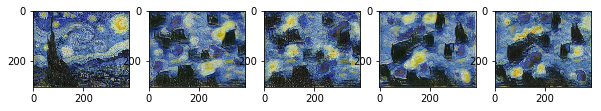

Scale: 5 / Epoch: 1750 / G Loss: -680.28583 / D Loss: -188.26938


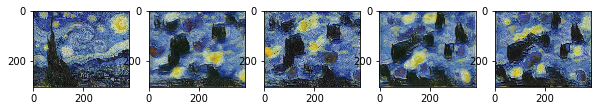

Scale: 5 / Epoch: 2000 / G Loss: -598.10370 / D Loss: -252.31204


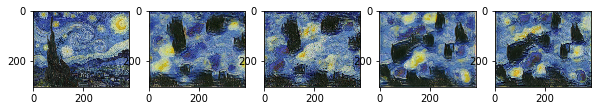

Assignment is finished!
Scale: 6 / Epoch: 250 / G Loss: -732.37494 / D Loss: -169.34715


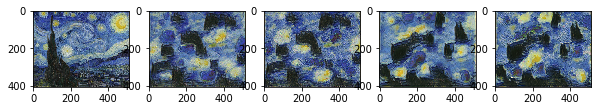

Scale: 6 / Epoch: 500 / G Loss: -703.73590 / D Loss: -147.64186


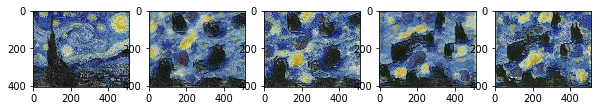

Scale: 6 / Epoch: 750 / G Loss: -633.77850 / D Loss: -130.75598


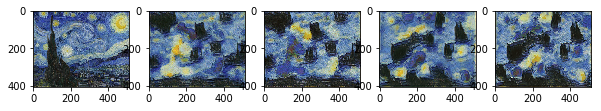

Scale: 6 / Epoch: 1000 / G Loss: -727.81464 / D Loss: -75.41028


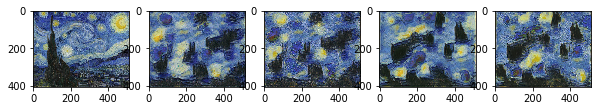

Scale: 6 / Epoch: 1250 / G Loss: -1035.66650 / D Loss: -119.85521


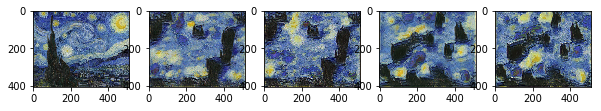

Scale: 6 / Epoch: 1500 / G Loss: -456.60242 / D Loss: -148.98805


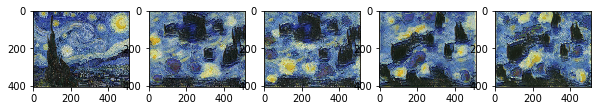

Scale: 6 / Epoch: 1750 / G Loss: 722.30151 / D Loss: -300.44269


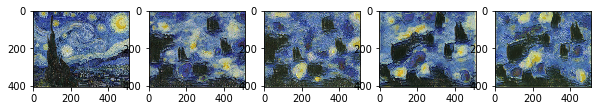

Scale: 6 / Epoch: 2000 / G Loss: -835.00415 / D Loss: -223.32425


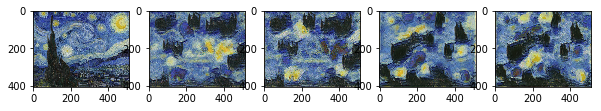

Assignment is finished!
Scale: 7 / Epoch: 250 / G Loss: 64.13611 / D Loss: -59.65813


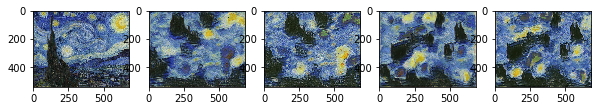

Scale: 7 / Epoch: 500 / G Loss: -73.96814 / D Loss: -109.77151


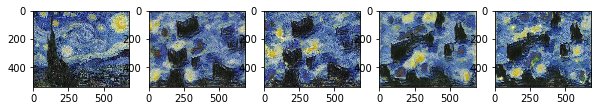

Scale: 7 / Epoch: 750 / G Loss: -322.33743 / D Loss: -115.93450


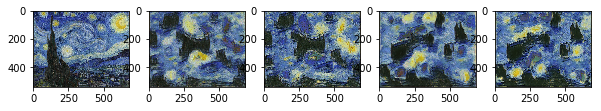

Scale: 7 / Epoch: 1000 / G Loss: -292.21817 / D Loss: -207.59192


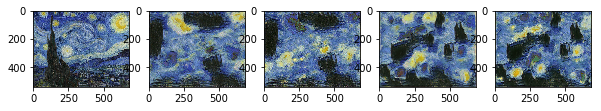

Scale: 7 / Epoch: 1250 / G Loss: 530.41278 / D Loss: -311.24823


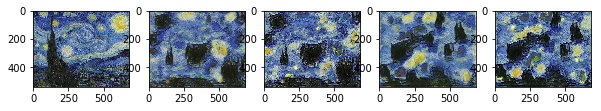

Scale: 7 / Epoch: 1500 / G Loss: -39.65857 / D Loss: -356.71210


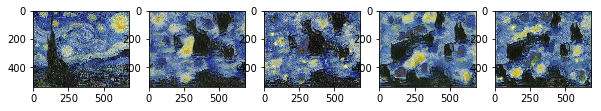

Scale: 7 / Epoch: 1750 / G Loss: 263.74429 / D Loss: -110.63317


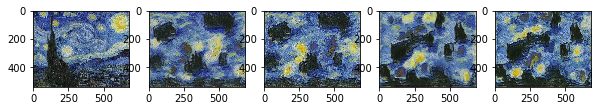

Scale: 7 / Epoch: 2000 / G Loss: -272.81885 / D Loss: -104.23245


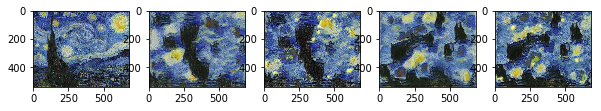

In [11]:
set_noise = noise_fix(img_size_set)

iteration = 0
for i in range(num_scale):
    for j in range(num_epoch[i]):
        if (i != 0) and (j == 0):
            if filters[i] == filters[i-1]:
                for k in range(len(network.var_gen[str(i)])):
                    network.sess.run(network.var_gen[str(i)][k].assign(network.var_gen[str(i-1)][k]))
                for k in range(len(network.var_dis[str(i)])):
                    network.sess.run(network.var_dis[str(i)][k].assign(network.var_dis[str(i-1)][k]))
                print("Assignment is finished!")

        if (i != 0):
            learning_rate = learning_rate*0.99995

        feed_dict = {network.learning_rate: learning_rate,
                     network.inp[str(0)]: [np.zeros(img_size_set[0])],
                     network.noise[str(0)]: img_noise(img_size_set[0]),
                     network.inp_fix[str(0)]: [np.zeros(img_size_set[0])],
                     network.noise_fix[str(0)]: set_noise[0],
                     network.real[str(0)]: [img_N[0]]}

        for k in range(i):
            fake, fake_fix = network.sess.run([network.fake[str(k)], network.fake_fix[str(k)]],
                                              feed_dict = feed_dict)
            feed_dict[network.inp[str(k+1)]] = img_resize(fake[0], img_size_set[k+1])
            feed_dict[network.inp_fix[str(k+1)]] = img_resize(fake_fix[0], img_size_set[k+1])

            feed_dict[network.noise[str(k+1)]] = img_noise(img_size_set[k+1])
            feed_dict[network.noise_fix[str(k+1)]] = set_noise[k+1]
            feed_dict[network.real[str(k+1)]] = [img_N[k+1]]

        for _ in range(iter_grad):
            _, loss_gen = network.sess.run([network.opt_gen[str(i)], network.loss_gen[str(i)]],
                                           feed_dict=feed_dict)
        for _ in range(iter_grad):    
            _, loss_dis = network.sess.run([network.opt_dis[str(i)], network.loss_dis[str(i)]],
                                           feed_dict=feed_dict)

        fake, inp = network.sess.run([network.fake[str(i)], network.inp[str(i)]], feed_dict=feed_dict)
        fake_fix, inp_fix = network.sess.run([network.fake_fix[str(i)], network.inp_fix[str(i)]], feed_dict=feed_dict)
        fake = denorm(fake)
        inp = denorm(inp)
        fake_fix = denorm(fake_fix)
        inp_fix = denorm(inp_fix)

        if j % 250 == 249:
            print("Scale: {} / Epoch: {} / G Loss: {:.5f} / D Loss: {:.5f}".format((i) ,(j+1), loss_gen, loss_dis))
            fig, ax = plt.subplots(1,5, figsize=[10,50])
            ax[0].imshow(denorm(img_N[i]))
            ax[1].imshow(inp[0])
            ax[2].imshow(fake[0])
            ax[3].imshow(inp_fix[0])
            ax[4].imshow(fake_fix[0])
            plt.show()
        iteration += 1

## Test Image

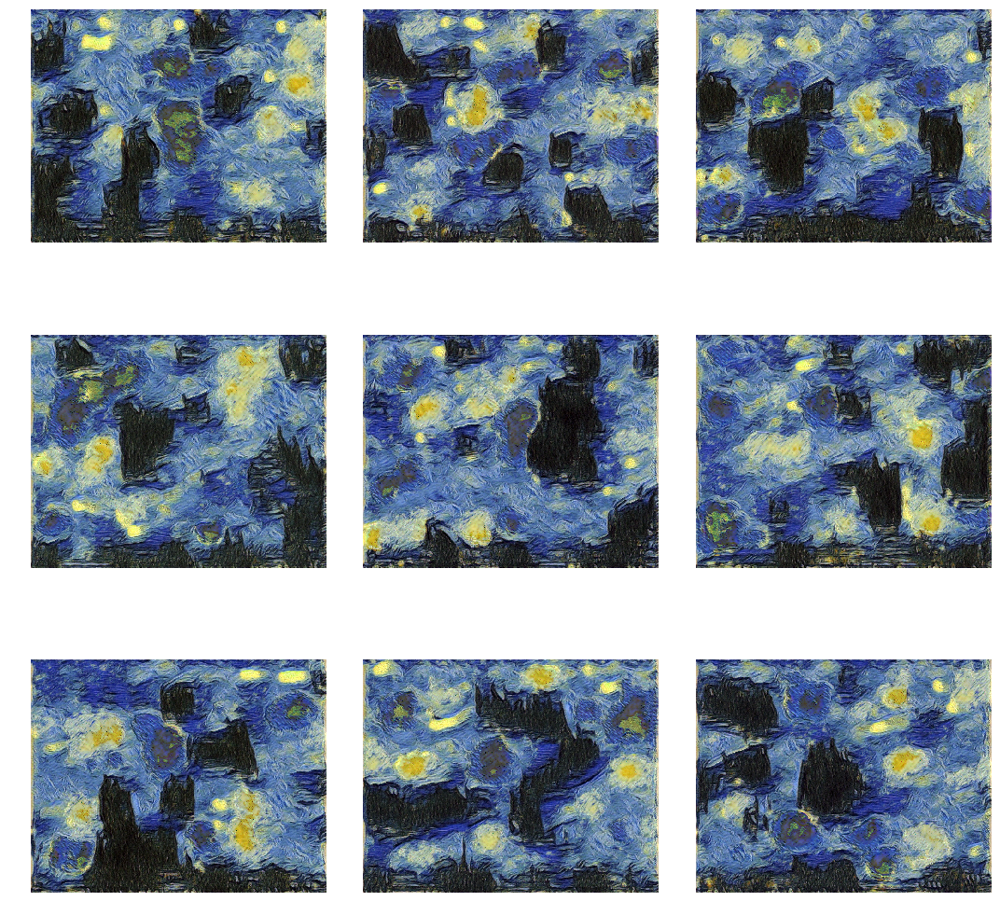

In [15]:
fig, ax = plt.subplots(3,3, figsize=[15,15])
for i in range(9):
    feed_dict = {network.inp[str(0)]: [np.zeros(img_size_set[0])],
                 network.noise[str(0)]: img_noise(img_size_set[0]),
                 network.inp_fix[str(0)]: [np.zeros(img_size_set[0])],
                 network.noise_fix[str(0)]: set_noise[0],
                 network.real[str(0)]: [img_N[0]]}

    for k in range(num_scale - 1):
        fake, fake_fix = network.sess.run([network.fake[str(k)], network.fake_fix[str(k)]],
                                          feed_dict = feed_dict)
        feed_dict[network.inp[str(k+1)]] = img_resize(fake[0], img_size_set[k+1])
        feed_dict[network.inp_fix[str(k+1)]] = img_resize(fake_fix[0], img_size_set[k+1])
        feed_dict[network.noise[str(k+1)]] = img_noise(img_size_set[k+1])
        feed_dict[network.noise_fix[str(k+1)]] = set_noise[k+1]
        feed_dict[network.real[str(k+1)]] = [img_N[k+1]]

    fake, inp = network.sess.run([network.fake[str(num_scale-1)], network.inp[str(num_scale-1)]], feed_dict=feed_dict)
    index = [int(i/3), i%3]
    ax[index[0]][index[1]].imshow(denorm(fake[0]))
    ax[index[0]][index[1]].axis('off')
fig.tight_layout()

## Harmonization

Text(0.5,1,'scale 8')

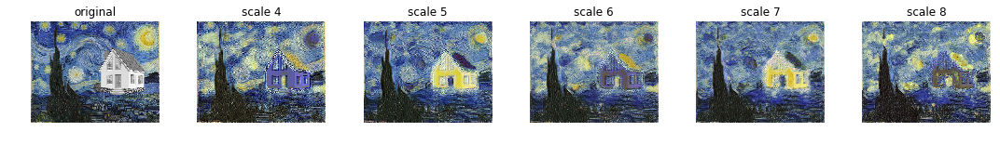

In [16]:
feed_dict = {network.inp[str(3)]: [img_naive_N[3]],
             network.noise[str(3)]: [np.zeros(img_size_set[3])]}

fake = network.sess.run(network.fake[str(3)], feed_dict = feed_dict)
fig, ax = plt.subplots(1,6, figsize=[15,80])
ax[0].imshow(denorm(img_naive_N[-1]))
ax[0].axis('off')
ax[0].set_title('original')
for k in range(num_scale - 4):
    fake = network.sess.run(network.fake[str(k+3)], feed_dict = feed_dict)
    feed_dict[network.inp[str(k+4)]] = img_resize(fake[0], img_size_set[k+4])
    feed_dict[network.noise[str(k+4)]] = img_noise(img_size_set[k+4])
    ax[k+1].imshow(denorm(fake[0]))
    ax[k+1].axis('off')
    ax[k+1].set_title('scale '+str(k+4))
fake, inp = network.sess.run([network.fake[str(num_scale-1)], network.inp[str(num_scale-1)]], feed_dict=feed_dict)
ax[-1].imshow(denorm(fake[0]))
ax[-1].axis('off')
fig.tight_layout()
ax[-1].set_title('scale 8')

(-0.5, 682.5, 539.5, -0.5)

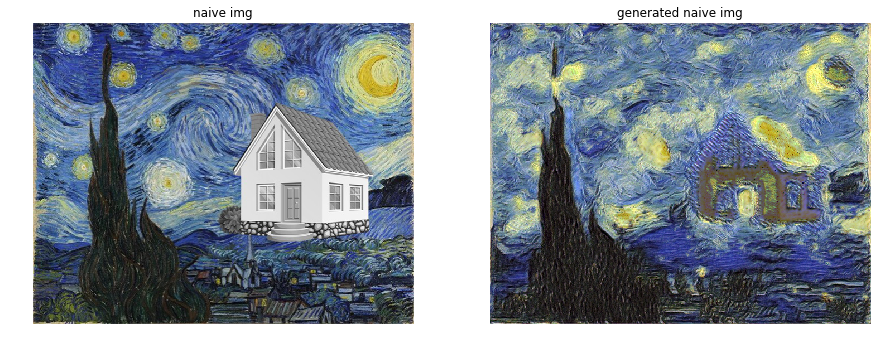

In [17]:
fig, ax = plt.subplots(1,2, figsize=[15,40])
ax[0].imshow(denorm(img_naive_N[-1]))
ax[1].imshow(denorm(fake[0]))
ax[0].set_title('naive img')
ax[1].set_title('generated naive img')
ax[0].axis('off')
ax[1].axis('off')